<a href="https://colab.research.google.com/github/mangekkyo/Breast-Cancer/blob/main/Noise_based_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

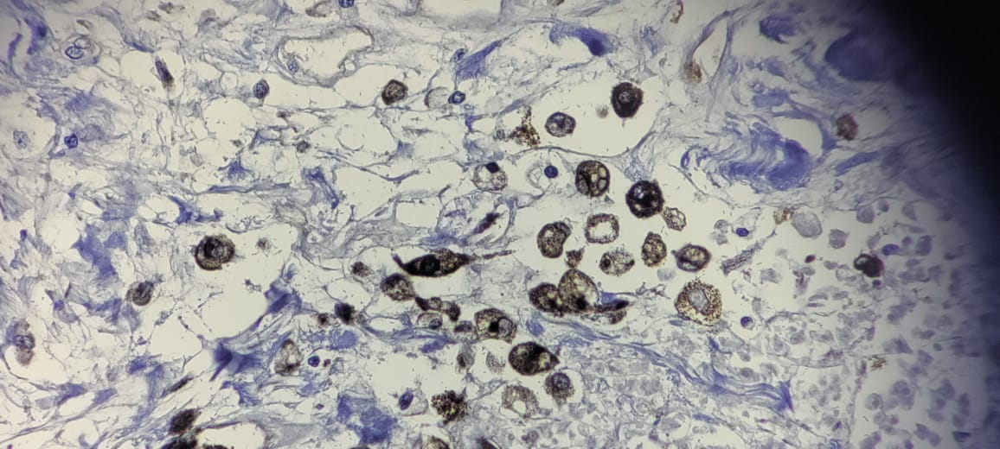

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
path='/content/drive/MyDrive/IMG PreProcessing/dataset'
data=cv2.imread(f"{path}/12.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(data)

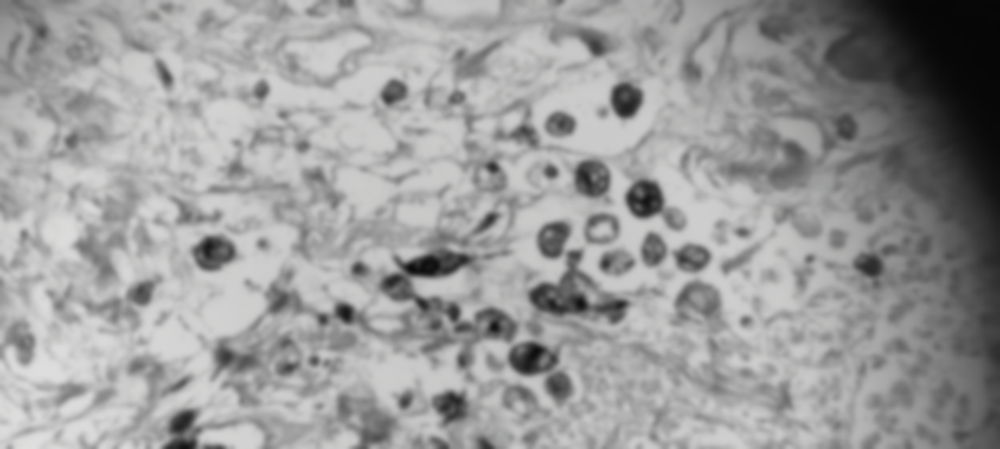

In [ ]:
#Gaussian filter
from scipy import ndimage as n
gauss=n.gaussian_filter(data,sigma=3)
cv2_imshow(gauss)

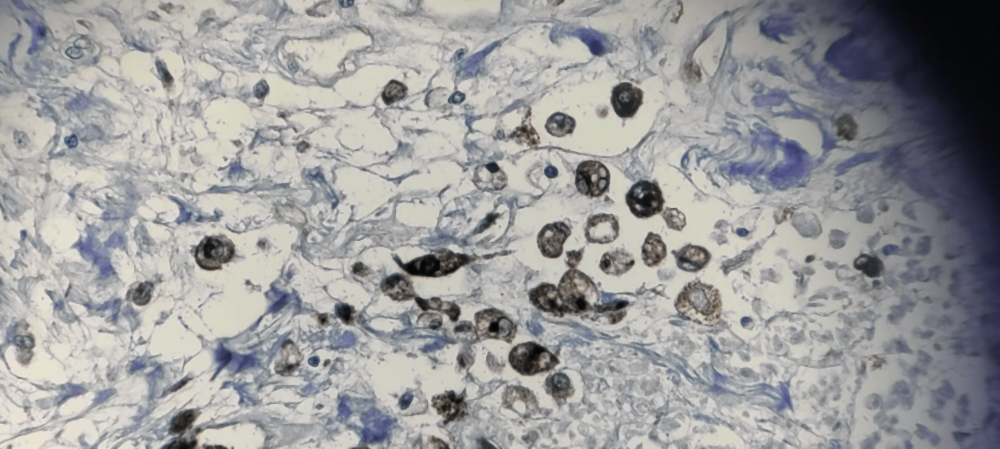

In [ ]:
#median filter
median=n.median_filter(data,size=3)
cv2_imshow(median)

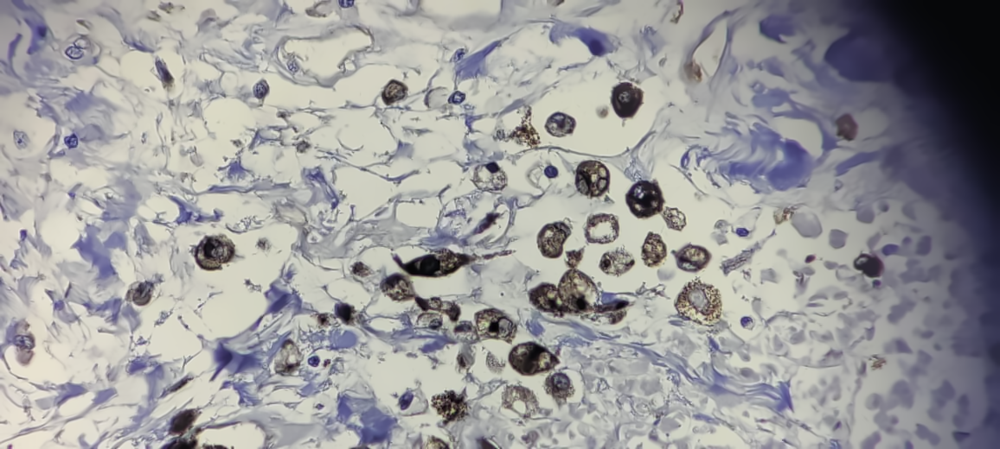

In [ ]:
denoised_img=cv2.fastNlMeansDenoising(data,None,h=10,templateWindowSize=7,searchWindowSize=21)
cv2.imwrite('denoised_image.png',denoised_img)
cv2_imshow(denoised_img)

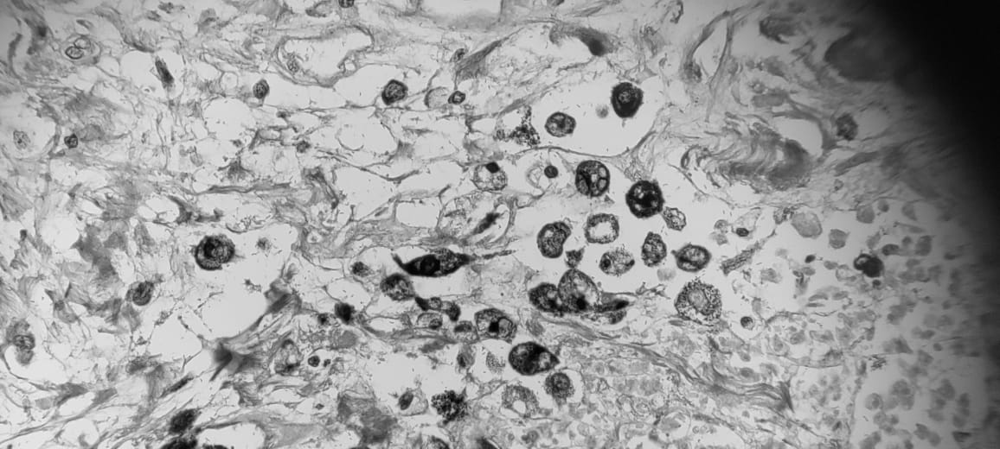

In [ ]:
gray = cv2.cvtColor(data, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

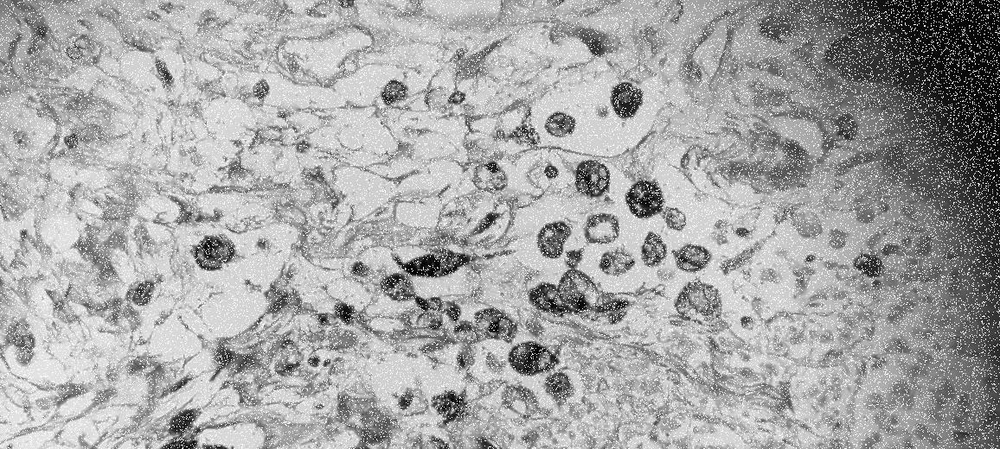

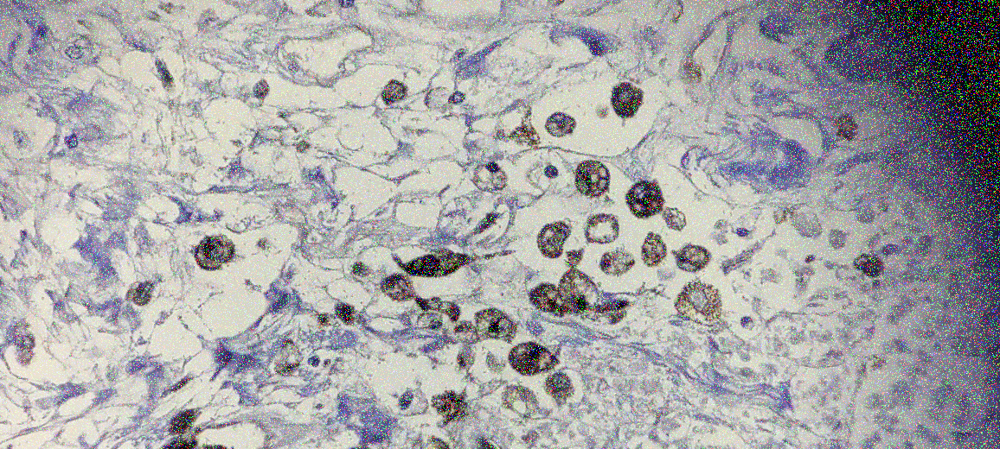

In [ ]:
#Up noising the image
import cv2
import numpy as np
# Add Gaussian noise to the image
mean = 0
stddev =0.8  # Adjust the standard deviation to control the intensity of the noise
gaussian_noise = np.random.normal(mean, stddev, gray.shape).astype(np.uint8)
noisy_gray=cv2.add(gray, gaussian_noise)
cv2_imshow(noisy_gray)
noise2=np.random.normal(mean, stddev, data.shape).astype(np.uint8)
noisy_rgb = cv2.add(data, noise2)
cv2_imshow(noisy_rgb)
# Display the noisy image



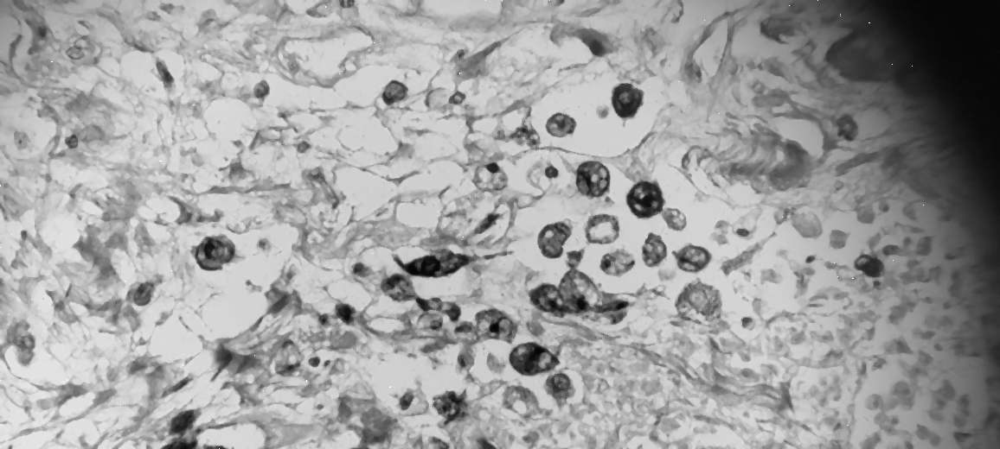

In [ ]:
#Applying median filter of up-noised image
up_median=n.median_filter(noisy_gray,size=4)
cv2_imshow(up_median)

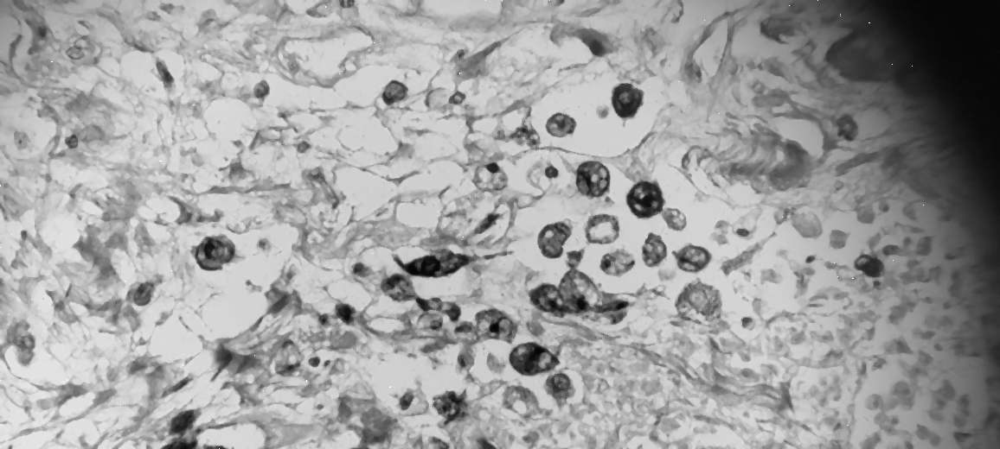

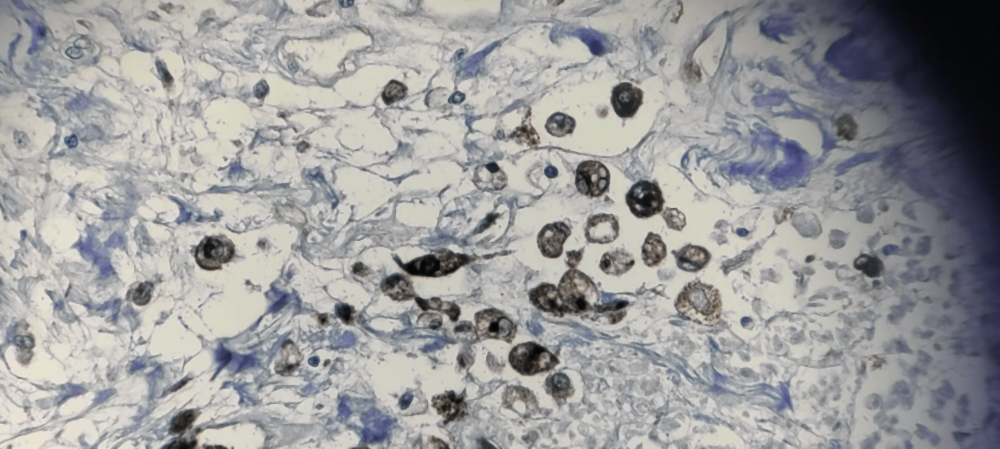

In [ ]:
cv2_imshow(up_median)
cv2_imshow(median)

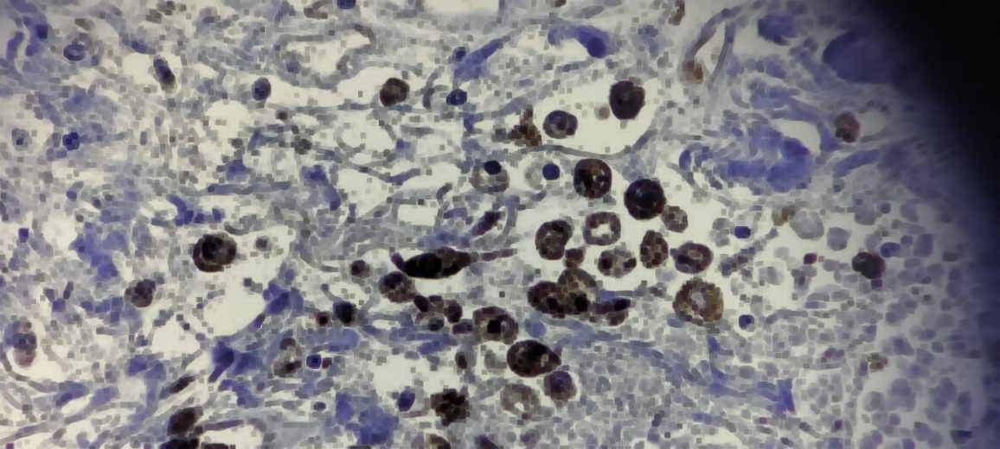

In [ ]:
kernel = np.ones((5, 5), np.uint8)
erosion = cv2.erode(data, kernel, iterations=1)
cv2_imshow(erosion)

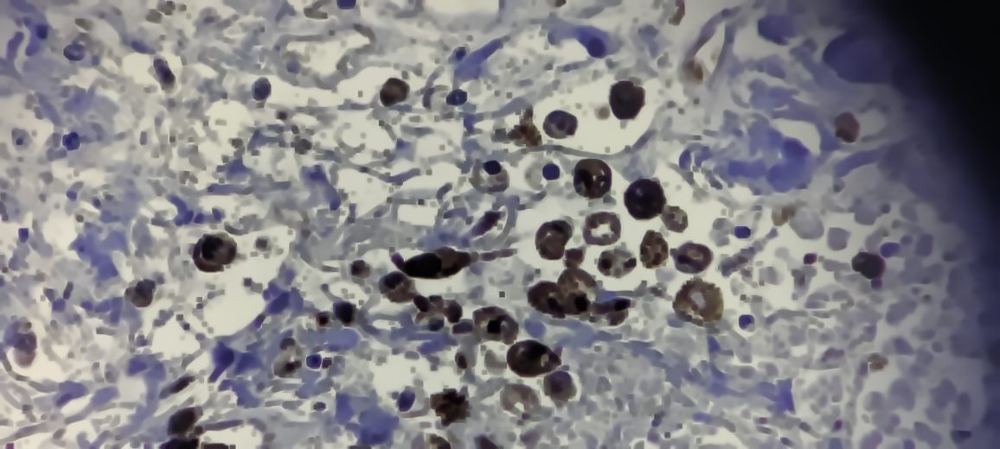

In [ ]:
den_img=cv2.fastNlMeansDenoising(erosion,None,h=10,templateWindowSize=7,searchWindowSize=21)
cv2.imwrite('denoised_image.png',den_img)
cv2_imshow(den_img)

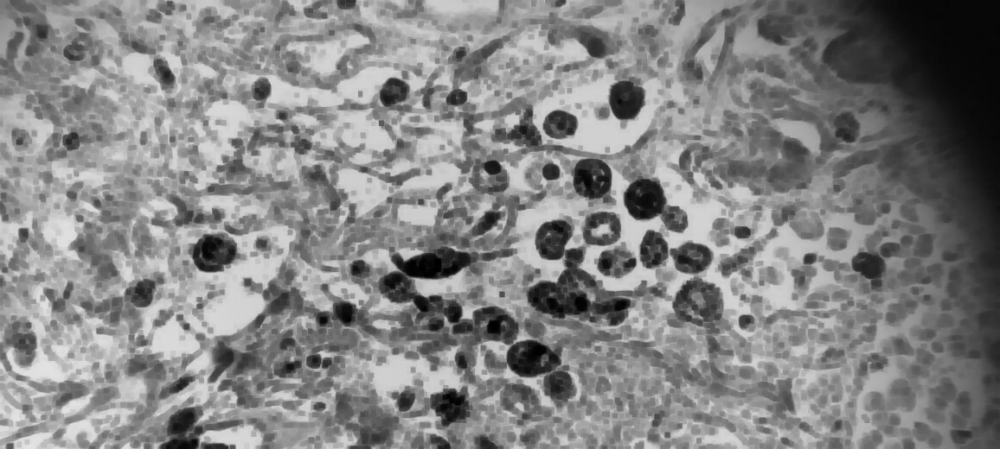

In [ ]:
gray = cv2.cvtColor(erosion, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

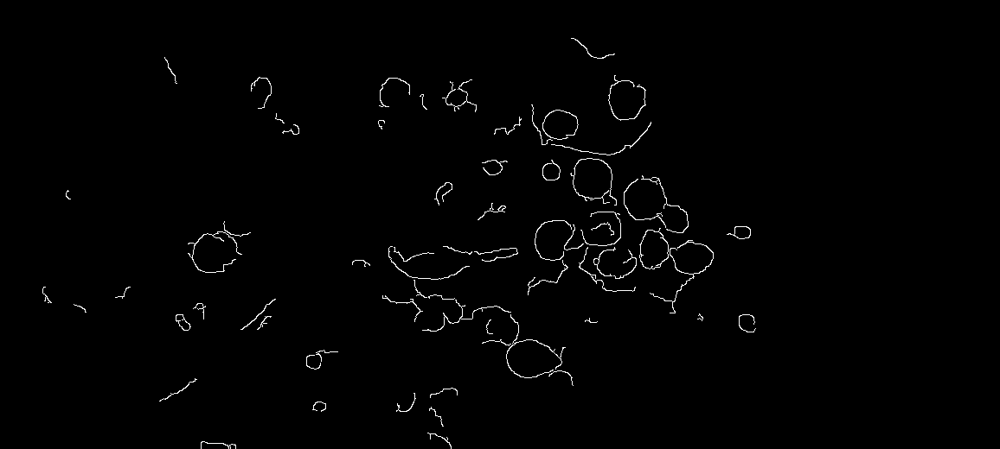

In [ ]:
threshold1 = 190
threshold2 = 550
edges = cv2.Canny(gray, threshold1, threshold2)
cv2_imshow(edges)

Number of circles detected: 11


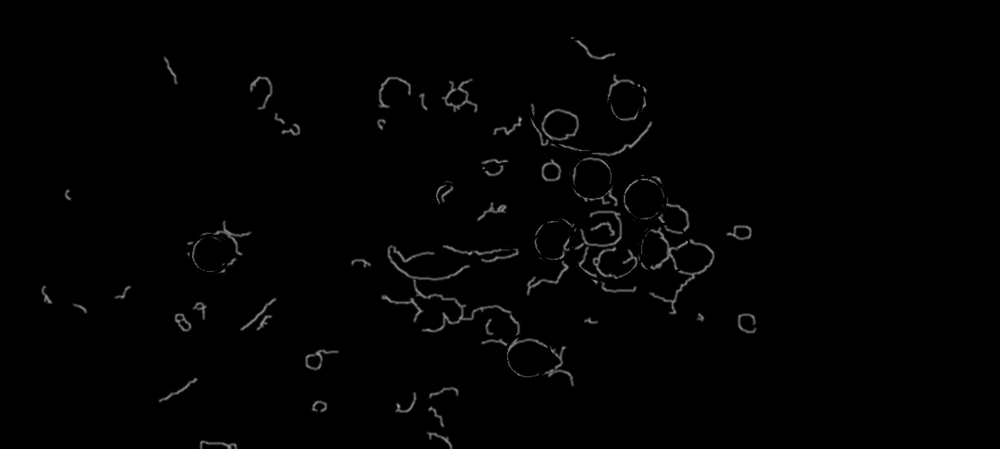

In [ ]:
import cv2
import numpy as np

image_blur = cv2.GaussianBlur(edges, (5, 5), 0)

# Apply Hough Circle Transform
circles = cv2.HoughCircles(image_blur, cv2.HOUGH_GRADIENT, dp=1, minDist=50,
                           param1=50, param2=30, minRadius=10, maxRadius=100)

# Check if any circles were detected
if circles is not None:
    # Convert the coordinates and radius to integers
    circles = np.round(circles[0, :]).astype(int)

    # Draw the detected circles on the image
    for (x, y, r) in circles:
        cv2.circle(image_blur, (x, y), r, (0, 255, 0), 2)

    # Count the number of circles
    num_circles = len(circles)
    print("Number of circles detected:", num_circles)
else:
    print("No circles detected.")

# Display the image with detected circles
cv2_imshow(image_blur)



Median filter applied on up-noised image gives smoother and clearer edges of the lesion circles.